Variabili, tipi e funzioni anonime
==================================
Vediamo un come usare le variabili in Julia.  
La cosa più facile è usare l'operatore di assegnazione e lasciare inferire il tipo.  
Se scrivo

In [ ]:
a = 21

ogni volta che scrivo `a`, sto "usando" il numero 21.  
Per esempio

In [ ]:
a

In [ ]:
a+23

In [ ]:
a = a+a

In [ ]:
a

Questo è il modo più semplice per assegnare una variabile.  
Per ora sorvoliamo sui tipi delle variabili e vediamo un po' di regole di buona tipografia.  
Le variabili possono essere rappresentate da qualsiasi carattere UNICODE.  
Per esempio

In [ ]:
π

In [ ]:
π = 23

questo non me lo fa fare perché $\pi$ è già definita come una costante

In [ ]:
π

In [ ]:
ψ = 23.456
χ = 23

e richiamare il valore della variabile con il simbolo $\phi$  o $\chi$ 

In [ ]:
ϕ

Questi simboli si scrivono come i LaTeX seguiti da `tab`.  
Se ne possono usare tantissimi 

## Funzioni anonime
Possiamo definirne una così

In [ ]:
x -> x^2+2x

oppure come

In [ ]:
function (x)
    x^2+2x
end

ma come le uso, visto che non gli ho dato alcun nome?  
Un uso tipico è per esempio all'interno  di `map`.  
Per esempio, posso arrotondare all'intero più vicino gli elementi di un array

In [ ]:
map(round, [1.2,2.3,3.6])

usando una funzione anonima avrei potuto scrivere, per esempio

In [ ]:
map(x->x^2+3x,[1,2,3,4,5,6,7,8,9,10])

oppure, per calcolare la successione delle somme dei primi `n` numeri

In [ ]:
map(x->x*(x+1)/2,[1,2,3,4,5,6,7,8,9,10])

**Esercizio: come ottenere questo risultato sotto forma di iteri, senza la virgola?**

Per l'esercizio successivo abbiamo bisoglo di un `package` per il plot di funzioni.  
Usiamo la libreria `Plot`, ma ce ne sono tantissime.

In [3]:
using Plots

definiamo una funzione (in un terzo modo rispetto ai due visti prima)

In [ ]:
f(x)=1-x^2

e facciamone il grafico

In [ ]:
plot(f,-3,3)

In [ ]:
definiamo una seconda funzione

In [ ]:
g(x)=cos(x)

In [ ]:
e un insieme di valori per la variabile indipendente

In [ ]:
intervallo = range(0,stop=1,length=100)

facciamo il plot di `f` e `g` in forma parametrica nell'intervallo $t\in[0,1]$

In [ ]:
    plot(f,g,0,1)

In [ ]:
plot(f.(intervallo),g.(intervallo))

In [ ]:
Se vogliamo disegnare una circonferenza in forma parametrica definiamo

In [1]:
f(x) = cos(x); g(x) = sin(x)

g (generic function with 1 method)

e facciamo il plot per $t\in[0,2\pi]$

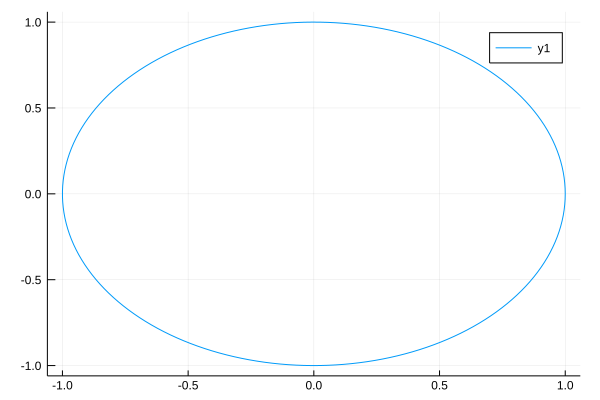

In [4]:
plot(f, g,0,2π)

Ora che sappiamo fare un grafico, proviamo a scrivere una base di Bernstein e a realizzare delle curve di Bezier.  
Definiamo il la funzione coefficiente binomiale.
In realtà possiamo verificare che questa funzione già esiste in Julia:

In [ ]:
@show binomial(5, 3)

ma possiamo definirne una versione ricorsiva

In [ ]:
function binom(n::Int64, k::Int64)
  n ≥ k || return 0 
  n == 1 || k == 0 && return 1
 
  return (n * binom(n - 1, k - 1)) ÷ k
end
 
@show binom(5, 3)

oppure una più banale

In [ ]:
function bino(n::Int64,k::Int64)::Int64
    return factorial(n)/(factorial(k)*factorial(n-k))
end

In [ ]:
bino(5,3)

Definiamo poi la `J` funzione che restituisce una funzione, sfruttando proprio il concetto di funzione anonima

In [ ]:
J = (n,k) -> (t)-> bino(n,k)t^k * (1-t)^(n-k)

facciamo un piccolo test

In [ ]:
J(2,1)(1.2)

e il plot

In [ ]:
plot(J(3,2),0,1)

Le funzioni così definite si possono sommare. La loro somma restituisce di nuovo una funzione

In [ ]:
kk = t -> J(2,0)(t) + J(2,1)(t)

della quale possiamo fare il grafico

In [ ]:
plot(kk,0,1)

Oppure possiamo prendere i polinomi così definiti e inserirli in un `array`

In [ ]:
dd = t->[J(2,0)(t),J(2,1)(t),J(2,2)(t)]

se calcoliamo il valore di questa funzione in un punto otteniamo un `array` di valori

In [ ]:
dd(0.3)

Possiamo sommare le funzioni componenti dell'array, ottenendo di nuovo una funzione

In [ ]:
a2 = t->sum(dd(t))

che, al solito, possiamo calcolare in un punto

In [ ]:
a2(0.2)

definiamo ora gli array di coefficienti

In [ ]:
b = [1,2]

In [ ]:
c = [3,4]

e il loro prodotto elemento per elemento

In [ ]:
b.*c

Facciamo qualche altra prova

In [ ]:
ar1=[1,2,3,4]

In [ ]:
ar2=[5,6,7,8]

che possiamo sommare

In [ ]:
ar1+ar2

e motiplicare

In [ ]:
ar1 .* ar2

definiamo poi un array di coppie di numeri

In [ ]:
ar3=[1 2;2 4;3 6;4 8]

la sintassi `array[:,k]` mi dà la k-esima colonna

In [ ]:
ar3[:,2]

In [ ]:
ar3[:,1].*ar1

In [ ]:
ar1

Ora non ci resta che definire i coefficienti della curva di Bezier

In [ ]:
leB=[0.5 0.5; 1 0; 1 1]

e definire le due funzioni parametriche

In [ ]:
px=t->sum(leB[:,1].*dd(t))

In [ ]:
py=t->sum(leB[:,2].*dd(t))

Il risultato è proprio la curva di Bezier cercata

In [ ]:
plot(px,py,0,1)

** Esercizio: scrivere una funzione che restituisce le due funzioni parametriche prendendo come input solo l'array dei coefficienti **